In [141]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import statsmodels
import statistics
# statistics
from statsmodels.distributions.empirical_distribution import ECDF
#from fbprophet import Prophet
from prophet import Prophet
#from fbprophet.plot import plot_plotly
#from fbprophet.plot import add_changepoints_to_plot
import plotly.graph_objects as go
import plotly.express as px
# time series analysis
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings("ignore")

from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import  mean_squared_error
import statsmodels.api as sm
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [2]:
from sklearn import metrics

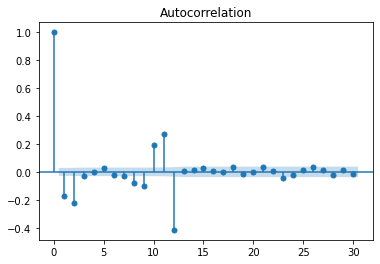

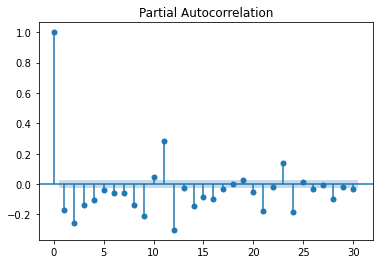

In [151]:
plot_acf((data['sales'].diff(12).dropna().diff(1).dropna()),lags=30)
plot_pacf((data['sales'].diff(12).dropna().diff(1).dropna()),method="ywmle",lags=30);

In [3]:
import itertools
p = q = range(0, 3)
P=Q=range(0,3)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(P, D, Q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)


In [4]:
SARIMA_AICs12 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AICs12

,param,seasonal,AIC


In [5]:
cp = pd.read_csv('data_t10.csv',parse_dates=True,index_col='date')
cp.head()

,product,city,sales
date,,,
2014-04-01,Mixers,Mumbai,2679347
2014-05-01,Mixers,Mumbai,3864612
2014-06-01,Mixers,Mumbai,2932658
2014-07-01,Mixers,Mumbai,3703713
2014-08-01,Mixers,Mumbai,3931029


In [10]:
cp1=pd.DataFrame(cp.groupby(["date","city"])["sales"].sum()).reset_index()
cp1.head()

,date,city,sales
0,2014-04-01,Ahmd,6299069
1,2014-04-01,Bangalore,9791615
2,2014-04-01,Chennai,10559954
3,2014-04-01,Cochin,5578723
4,2014-04-01,Delhi,1697065


In [15]:
cp1.set_index(["date"],inplace=True)
cp1.head()

,city,sales
date,,
2014-04-01,Ahmd,6299069
2014-04-01,Bangalore,9791615
2014-04-01,Chennai,10559954
2014-04-01,Cochin,5578723
2014-04-01,Delhi,1697065


In [41]:
sarimarmse=[]

# AHMD

In [27]:
cp2 = cp1[(cp1['city']== "Ahmd")]

In [30]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [31]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:999.3074471465616
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:609.2708936765572
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:224.52726582067828
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:621.5107988055527
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:600.8610736746606
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:226.52726341825752
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:252.00402726414455
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:259.009748675638
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:228.52726356798397
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:964.6192927003644
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:576.532757580843
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:195.20916612646482
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:634.0233999980934
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:571.6489929286429
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:197.21150418531622
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:258.41077515233974
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:260.4107751244683
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:199.0570790423839
SARIMA(0, 1, 2)x(0, 0, 

In [32]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
101,"(0, 1, 2)","(0, 0, 2, 12)",165.295693
128,"(1, 1, 2)","(0, 0, 2, 12)",167.273965
104,"(0, 1, 2)","(1, 0, 2, 12)",167.301983
155,"(2, 1, 2)","(0, 0, 2, 12)",169.258827
20,"(0, 1, 2)","(0, 0, 2, 12)",169.270709


In [33]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -77.648
Date:                            Tue, 27 Jul 2021   AIC                            165.296
Time:                                    15:37:54   BIC                            163.343
Sample:                                         0   HQIC                           160.055
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3382     16.072      0.021      0.983     -31.162      31.838
ma.L2          0.6589      5.104   

In [34]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [37]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)

In [42]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037]

# Bangalore

In [43]:
cp2 = cp1[(cp1['city']== "Bangalore")]

In [44]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [45]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1019.4696313649131
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:619.59669279486
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:228.86576553760824
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:638.8582331251416
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:615.4012728824998
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:230.86576543602428
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:260.9596238384819
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:265.3787109756883
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:232.86576525742157
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:981.2607408009595
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:585.9938110895818
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:199.65309364049259
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:648.984953225464
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:584.9751302937241
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:201.44753069739656
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:264.02530260533894
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:266.0223121438039
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:203.44831970502176
SARIMA(0, 1, 2)x(0, 0, 

In [46]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
101,"(0, 1, 2)","(0, 0, 2, 12)",165.295693
128,"(1, 1, 2)","(0, 0, 2, 12)",167.273965
104,"(0, 1, 2)","(1, 0, 2, 12)",167.301983
182,"(0, 1, 2)","(0, 0, 2, 12)",168.923083
155,"(2, 1, 2)","(0, 0, 2, 12)",169.258827


In [47]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -79.462
Date:                            Tue, 27 Jul 2021   AIC                            168.923
Time:                                    16:00:52   BIC                            166.970
Sample:                                         0   HQIC                           163.682
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2855      1.931     -0.148      0.882      -4.070       3.499
ma.L2         -0.7387      2.076   

In [48]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [49]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)

In [50]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037, 1293379.9580332085]

# Chennai

In [51]:
cp2 = cp1[(cp1['city']== "Chennai")]

In [52]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [18]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1017.7129402534787
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:619.0304254445325
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:228.58371167890488
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:623.1554537803098
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:611.2416732940578
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:230.58371169971096
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:241.05416273212492
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:262.6474017518966
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:232.58370943496692
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:984.2022085342034
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:588.9260920690086
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:198.80272602512522
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:644.1484828783545
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:581.1253702685939
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:200.80271833650488
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:262.5419719610445
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:264.5352330905924
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:202.80265579681918
SARIMA(0, 1, 2)x(0, 

In [19]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
20,"(0, 1, 2)","(0, 0, 2, 12)",169.270709
47,"(1, 1, 2)","(0, 0, 2, 12)",170.763802
23,"(0, 1, 2)","(1, 0, 2, 12)",171.264575
74,"(2, 1, 2)","(0, 0, 2, 12)",172.249558
50,"(1, 1, 2)","(1, 0, 2, 12)",172.763094


In [20]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -79.635
Date:                            Tue, 27 Jul 2021   AIC                            169.271
Time:                                    15:13:47   BIC                            167.318
Sample:                                         0   HQIC                           164.030
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.8883    376.753      0.002      0.998    -737.535     739.311
ma.L2          0.1983    227.076   

In [21]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [54]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
sarimarmse.append(rmses12)

In [55]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037, 1293379.9580332085, 3388988.8920302503]

# Cochin

In [56]:
cp2 = cp1[(cp1['city']== "Cochin")]

In [57]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [58]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1004.5844767983046
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:617.8709933692568
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:228.91598248827444
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:636.9589770877718
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:607.6170087574031
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:230.91597518748486
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:259.63446282012615
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:262.7652536519878
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:232.91597543644605
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:973.6710630974654
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:584.9254240499793
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:197.01347580197486
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:642.8785370007425
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:579.4682816613504
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:199.01486013656336
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:262.9781545508814
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:264.9781545978609
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:201.01439880702785
SARIMA(0, 1, 2)x(0, 

In [59]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
101,"(0, 1, 2)","(0, 0, 2, 12)",165.295693
128,"(1, 1, 2)","(0, 0, 2, 12)",167.273965
104,"(0, 1, 2)","(1, 0, 2, 12)",167.301983
263,"(0, 1, 2)","(0, 0, 2, 12)",167.454746
182,"(0, 1, 2)","(0, 0, 2, 12)",168.923083


In [60]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -78.727
Date:                            Tue, 27 Jul 2021   AIC                            167.455
Time:                                    16:02:32   BIC                            165.502
Sample:                                         0   HQIC                           162.214
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2577      3.124     -0.082      0.934      -6.381       5.866
ma.L2          0.9738      1.475   

In [61]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [62]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

199678383.52421412


In [63]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412]

# Delhi

In [64]:
cp2 = cp1[(cp1['city']== "Delhi")]

In [65]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [66]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:937.9670672823491
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:577.3336211708477
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:210.6521922645162
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:599.0336409414986
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:569.0156680708438
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:212.65218929354634
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:246.17411714926155
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:248.2188432342519
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:214.65218324150888
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:906.8595325235515
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:545.3808322537193
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:184.2515124248727
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:600.0026576113447
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:540.9372129820338
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:186.06616306457576
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:243.75462908926954
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:244.60778924435027
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:187.65683996941124
SARIMA(0, 1, 2)x(0, 0

In [67]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998
398,"(2, 1, 2)","(0, 0, 2, 12)",159.235141
374,"(1, 1, 2)","(1, 0, 2, 12)",159.534183


In [68]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -72.971
Date:                            Tue, 27 Jul 2021   AIC                            155.941
Time:                                    16:03:27   BIC                            153.988
Sample:                                         0   HQIC                           150.700
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.7786     20.172      0.039      0.969     -38.758      40.315
ma.L2          0.1608     13.164   

In [69]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [70]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

1456206.4330160196


In [71]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196]

# Hyderabad

In [72]:
cp2 = cp1[(cp1['city']== "Hyderabad")]

In [73]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [74]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1003.9433487593598
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:614.3297573582132
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:225.83364690889033
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:641.9140220366255
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:613.3343279692785
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:227.8336467795296
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:264.83644660368145
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:266.8765457803938
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:229.8336463249047
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:968.9224407179698
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:583.4855806837116
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:196.26637986185577
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:644.4741919115147
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:582.4579570065113
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:198.62586926107224
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:262.26775778577814
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:261.70945563158864
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:200.6255652594391
SARIMA(0, 1, 2)x(0, 0

In [75]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998
398,"(2, 1, 2)","(0, 0, 2, 12)",159.235141
374,"(1, 1, 2)","(1, 0, 2, 12)",159.534183


In [76]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -78.243
Date:                            Tue, 27 Jul 2021   AIC                            166.486
Time:                                    16:04:46   BIC                            164.533
Sample:                                         0   HQIC                           161.245
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3290      1.716     -0.192      0.848      -3.692       3.034
ma.L2         -0.6917      1.742   

In [77]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [78]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

3900028.562381243


In [79]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196,
 3900028.562381243]

# Kolkata

In [81]:
cp2 = cp1[(cp1['city']== "Kolkata")]

In [82]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [83]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1014.8892771652503
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:617.5606570480808
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:228.08521417984147
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:643.9901372150216
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:617.2928731782622
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:230.08521394652092
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:263.9715542151947
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:266.4586320505963
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:232.08521385027697
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:971.0236302584973
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:581.5909291432805
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:197.62343841934205
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:641.8622236957934
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:580.2650520176513
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:199.83686094609197
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:262.8317985088813
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:262.9633166889671
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:201.5211386781935
SARIMA(0, 1, 2)x(0, 0,

In [84]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998
398,"(2, 1, 2)","(0, 0, 2, 12)",159.235141
374,"(1, 1, 2)","(1, 0, 2, 12)",159.534183


In [85]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -81.071
Date:                            Tue, 27 Jul 2021   AIC                            172.142
Time:                                    16:06:46   BIC                            170.189
Sample:                                         0   HQIC                           166.901
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2682      3.045     -0.417      0.677      -7.235       4.699
ma.L2         -1.0206      6.334   

In [86]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [87]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

11073063.614928262


In [88]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196,
 3900028.562381243,
 11073063.614928262]

# Mumbai

In [89]:
cp2 = cp1[(cp1['city']== "Mumbai")]

In [90]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [92]:
test

,city,sales
date,,
2017-01-01,Mumbai,13654721
2017-02-01,Mumbai,17023508
2017-03-01,Mumbai,26094869
2017-04-01,Mumbai,16590546
2017-05-01,Mumbai,19968213
2017-06-01,Mumbai,14899712
2017-07-01,Mumbai,20437447
2017-08-01,Mumbai,21754272
2017-09-01,Mumbai,24606056


In [91]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1051.130624414159
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:642.3013948228898
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:236.25937700899715
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:670.2928314674446
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:638.3500931572407
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:238.2593769657414
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:273.7084271053602
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:276.06485513237874
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:240.25937687955155
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1008.1125005866256
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:606.126103156539
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:205.14938480367425
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:673.901102188654
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:606.0850877927522
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:207.00656537444308
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:272.8218728382117
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:274.8197022659676
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:209.00413292914007
SARIMA(0, 1, 2)x(0, 0, 

In [93]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998
398,"(2, 1, 2)","(0, 0, 2, 12)",159.235141
374,"(1, 1, 2)","(1, 0, 2, 12)",159.534183


In [94]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -81.792
Date:                            Tue, 27 Jul 2021   AIC                            173.583
Time:                                    16:07:38   BIC                            171.631
Sample:                                         0   HQIC                           168.342
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          1.0549     20.364      0.052      0.959     -38.857      40.967
ma.L2          0.3027     14.822   

In [95]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

11218593.097294394


In [96]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196,
 3900028.562381243,
 11073063.614928262,
 11218593.097294394]

# Patna

In [97]:
cp2 = cp1[(cp1['city']== "Patna")]

In [98]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [99]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:942.9034760147819
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:576.3235395147208
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:212.14346041218653
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:602.2860616175006
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:576.1346352005779
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:214.14345807909882
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:248.30474572056852
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:250.30475757958175
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:216.1434544417282
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:905.0721594456488
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:543.9408038805575
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:184.65567527872219
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:600.7269351361011
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:542.7909963803913
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:185.82557280072552
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:243.2777033758322
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:245.21781531610915
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:188.76114535170385
SARIMA(0, 1, 2)x(0, 

In [100]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
668,"(0, 1, 2)","(0, 0, 2, 12)",155.651559
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
695,"(1, 1, 2)","(0, 0, 2, 12)",157.437239
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998


In [101]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -72.826
Date:                            Tue, 27 Jul 2021   AIC                            155.652
Time:                                    16:08:26   BIC                            153.699
Sample:                                         0   HQIC                           150.410
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2307      0.740     -0.312      0.755      -1.681       1.220
ma.L2         -0.6640      0.700   

In [102]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [103]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

2452461.0958648412


In [104]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196,
 3900028.562381243,
 11073063.614928262,
 11218593.097294394,
 2452461.0958648412]

# Pune

In [105]:
cp2 = cp1[(cp1['city']== "Pune")]

In [106]:
train    =   cp2[0:int(len(cp2)*0.7)] 
test     =   cp2[int(len(cp2)*0.7):]

In [107]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_models12 = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMAs12 = SARIMA_models12.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMAs12.aic))
        SARIMA_AICs12 = SARIMA_AICs12.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMAs12.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:993.6300792813474
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:607.4596395976473
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:223.21325791245837
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:633.4750109311042
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:603.863600192416
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:225.2132578238554
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:257.54618857899777
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:260.3406502103066
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:227.2132571082979
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:954.6517770601982
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:575.4217668149289
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:194.03678505625257
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:636.0821866907511
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:573.1844516982463
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:195.92152796533716
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:256.7218516148956
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:261.38347289664
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:197.91716676723638
SARIMA(0, 1, 2)x(0, 0, 0, 

In [108]:
SARIMA_AICs12.sort_values(by=['AIC']).head()

,param,seasonal,AIC
668,"(0, 1, 2)","(0, 0, 2, 12)",155.651559
344,"(0, 1, 2)","(0, 0, 2, 12)",155.941006
695,"(1, 1, 2)","(0, 0, 2, 12)",157.437239
371,"(1, 1, 2)","(0, 0, 2, 12)",157.617814
347,"(0, 1, 2)","(1, 0, 2, 12)",157.981998


In [109]:
import statsmodels.api as sm

auto_SARIMA_12s = sm.tsa.statespace.SARIMAX(train['sales'].values,
                                order=(0, 1, 2),
                                seasonal_order=(0, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12s = auto_SARIMA_12s.fit(maxiter=1000)
print(results_auto_SARIMA_12s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                   33
Model:             SARIMAX(0, 1, 2)x(0, 0, 2, 12)   Log Likelihood                 -77.266
Date:                            Tue, 27 Jul 2021   AIC                            164.532
Time:                                    16:09:10   BIC                            162.579
Sample:                                         0   HQIC                           159.291
                                             - 33                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          1.1558     25.681      0.045      0.964     -49.178      51.490
ma.L2          0.3567     18.466   

In [110]:
predicted_auto_SARIMA_12s = results_auto_SARIMA_12s.get_forecast(steps=len(test))

In [111]:
rmses12 = mean_squared_error(test['sales'],predicted_auto_SARIMA_12s.predicted_mean,squared=False)
print(rmses12)

1977865.5200943805


In [112]:
sarimarmse.append(rmses12)
sarimarmse

[10371742.943125037,
 1293379.9580332085,
 3388988.8920302503,
 199678383.52421412,
 1456206.4330160196,
 3900028.562381243,
 11073063.614928262,
 11218593.097294394,
 2452461.0958648412,
 1977865.5200943805]

In [146]:
Avg= statistics.mean(sarimarmse)
Avg

24681071.364098176

In [116]:
data = pd.read_csv('data_t10.csv')
data.head()

,product,date,city,sales
0,Mixers,04-01-2014,Mumbai,2679347
1,Mixers,05-01-2014,Mumbai,3864612
2,Mixers,06-01-2014,Mumbai,2932658
3,Mixers,07-01-2014,Mumbai,3703713
4,Mixers,08-01-2014,Mumbai,3931029


In [118]:
data["product"]

0       Mixers
1       Mixers
2       Mixers
3       Mixers
4       Mixers
         ...  
4795      SECF
4796      SECF
4797      SECF
4798      SECF
4799      SECF
Name: product, Length: 4800, dtype: object

In [119]:
mixers_prod = data[(data['product'] == "Mixers") & (data['city'] == "Chennai")][['date','sales']]
dset = mixers_prod.rename(columns = {"date" : "ds","sales" : "y"})


In [120]:
pt = Prophet(seasonality_mode = 'multiplicative')
pt.fit(dset)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [122]:
future = pt.make_future_dataframe(periods = 12*2, freq = 'MS')
forecast = pt.predict(future)
forecast['city'] = "Chennai"
forecast['product'] = "Mixers"
#landing_tbl = landing_tbl.append(forecast)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,478103.827729,265410.777779,5.358831e+05,478103.827729,478103.827729,-0.152428,-0.152428,-0.152428,-0.152428,-0.152428,-0.152428,0.0,0.0,0.0,4.052273e+05,Chennai,Mixers
1,2014-05-01,482376.578092,400159.120900,6.701970e+05,482376.578092,482376.578092,0.078602,0.078602,0.078602,0.078602,0.078602,0.078602,0.0,0.0,0.0,5.202923e+05,Chennai,Mixers
2,2014-06-01,486791.753469,207777.202136,4.769097e+05,486791.753469,486791.753469,-0.292489,-0.292489,-0.292489,-0.292489,-0.292489,-0.292489,0.0,0.0,0.0,3.444104e+05,Chennai,Mixers
3,2014-07-01,491064.503833,383721.754248,6.516792e+05,491064.503833,491064.503833,0.055018,0.055018,0.055018,0.055018,0.055018,0.055018,0.0,0.0,0.0,5.180818e+05,Chennai,Mixers
4,2014-08-01,495479.679211,394374.258109,6.687740e+05,495479.679211,495479.679211,0.085760,0.085760,0.085760,0.085760,0.085760,0.085760,0.0,0.0,0.0,5.379721e+05,Chennai,Mixers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,768731.278114,366066.565236,6.309156e+05,768724.884411,768737.336773,-0.347282,-0.347282,-0.347282,-0.347282,-0.347282,-0.347282,0.0,0.0,0.0,5.017650e+05,Chennai,Mixers
68,2019-12-01,773006.231916,741846.926403,1.018520e+06,772999.396225,773012.703573,0.134408,0.134408,0.134408,0.134408,0.134408,0.134408,0.0,0.0,0.0,8.769046e+05,Chennai,Mixers
69,2020-01-01,777423.684178,610681.634548,8.927043e+05,777416.297448,777430.593846,-0.038799,-0.038799,-0.038799,-0.038799,-0.038799,-0.038799,0.0,0.0,0.0,7.472603e+05,Chennai,Mixers
70,2020-02-01,781841.136441,499851.483955,7.715452e+05,781833.331599,781848.462781,-0.197709,-0.197709,-0.197709,-0.197709,-0.197709,-0.197709,0.0,0.0,0.0,6.272644e+05,Chennai,Mixers


In [127]:
 landing_tbl=pd.DataFrame()

In [ ]:
 landing_tb2=pd.DataFrame()

In [128]:
for city in data['city'].unique():
    for prod in data['product'].unique(): 
        mixers_prod = data[(data['product'] == prod) & (data['city'] == city)][['date','sales']]
        dset = mixers_prod.rename(columns = {"date" : "ds","sales" : "y"})
        pt = Prophet(seasonality_mode = 'multiplicative')
        pt.fit(dset)
        future = pt.make_future_dataframe(periods = 12*2, freq = 'MS')
        forecast = pt.predict(future)
        forecast['city'] = city
        forecast['product'] = prod
        landing_tbl = landing_tbl.append(forecast)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to overr

In [ ]:
for city in data['city'].unique():
    for prod in data['product'].unique(): 
        mixers_prod = data[(data['product'] == prod) & (data['city'] == city)][['date','sales']]
        dset = mixers_prod.rename(columns = {"date" : "ds","sales" : "y"})
        pt = Prophet(seasonality_mode = 'multiplicative')
        pt.fit(dset)
        future = pt.make_future_dataframe(periods = 12*2, freq = 'MS')
        forecast = pt.predict(future)
        forecast['city'] = city
        forecast['product'] = prod
        landing_tbl = landing_tbl.append(forecast)

In [129]:
landing_tbl

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,3.393642e+06,1.958013e+06,3.911219e+06,3.393642e+06,3.393642e+06,-0.151523,-0.151523,-0.151523,-0.151523,-0.151523,-0.151523,0.0,0.0,0.0,2.879429e+06,Mumbai,Mixers
1,2014-05-01,3.422203e+06,2.712353e+06,4.680565e+06,3.422203e+06,3.422203e+06,0.081467,0.081467,0.081467,0.081467,0.081467,0.081467,0.0,0.0,0.0,3.701000e+06,Mumbai,Mixers
2,2014-06-01,3.451717e+06,1.589359e+06,3.485606e+06,3.451717e+06,3.451717e+06,-0.273240,-0.273240,-0.273240,-0.273240,-0.273240,-0.273240,0.0,0.0,0.0,2.508571e+06,Mumbai,Mixers
3,2014-07-01,3.480279e+06,2.755838e+06,4.680151e+06,3.480279e+06,3.480279e+06,0.075102,0.075102,0.075102,0.075102,0.075102,0.075102,0.0,0.0,0.0,3.741653e+06,Mumbai,Mixers
4,2014-08-01,3.509792e+06,2.966760e+06,4.842182e+06,3.509792e+06,3.509792e+06,0.113600,0.113600,0.113600,0.113600,0.113600,0.113600,0.0,0.0,0.0,3.908505e+06,Mumbai,Mixers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,3.162398e+04,6.473405e+03,2.127031e+04,3.162397e+04,3.162400e+04,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,0.0,0.0,0.0,1.410998e+04,Delhi,SECF
68,2019-12-01,3.199875e+04,2.195229e+04,3.715090e+04,3.199872e+04,3.199877e+04,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,0.0,0.0,0.0,2.943788e+04,Delhi,SECF
69,2020-01-01,3.238600e+04,1.448593e+04,2.956256e+04,3.238597e+04,3.238602e+04,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,0.0,0.0,0.0,2.205434e+04,Delhi,SECF
70,2020-02-01,3.277325e+04,2.729441e+04,4.206348e+04,3.277322e+04,3.277327e+04,0.075323,0.075323,0.075323,0.075323,0.075323,0.075323,0.0,0.0,0.0,3.524181e+04,Delhi,SECF


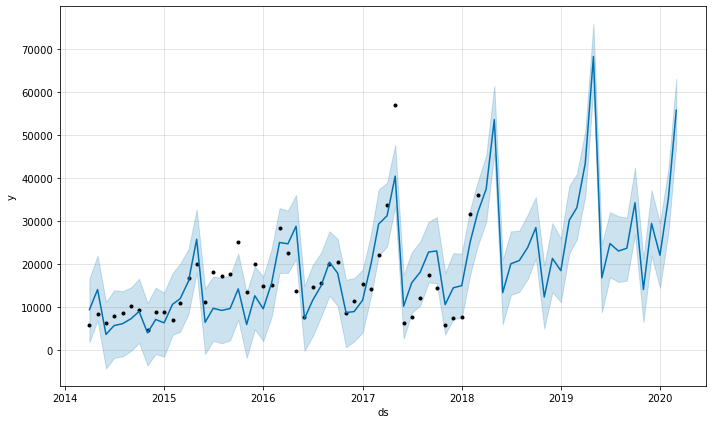

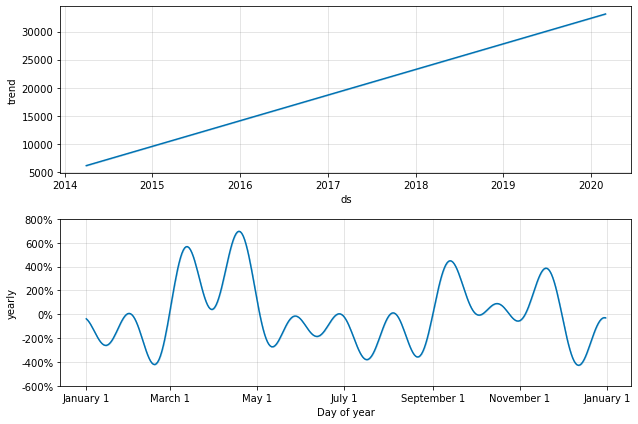

In [161]:
fig=pt.plot(forecast)
#a = pt.add_changepoints_to_plot(fig.gca(), prophet, forecast)
plt.show()
figs= pt.plot_components(forecast)
plt.show()

In [137]:
import math

In [139]:
rmse = math.sqrt(mean_squared_error(data['sales'],landing_tbl.head(4800)['yhat']))
print(rmse)

2533517.2727579963


In [178]:
landing_tbl

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,3.393642e+06,1.958013e+06,3.911219e+06,3.393642e+06,3.393642e+06,-0.151523,-0.151523,-0.151523,-0.151523,-0.151523,-0.151523,0.0,0.0,0.0,2.879429e+06,Mumbai,Mixers
1,2014-05-01,3.422203e+06,2.712353e+06,4.680565e+06,3.422203e+06,3.422203e+06,0.081467,0.081467,0.081467,0.081467,0.081467,0.081467,0.0,0.0,0.0,3.701000e+06,Mumbai,Mixers
2,2014-06-01,3.451717e+06,1.589359e+06,3.485606e+06,3.451717e+06,3.451717e+06,-0.273240,-0.273240,-0.273240,-0.273240,-0.273240,-0.273240,0.0,0.0,0.0,2.508571e+06,Mumbai,Mixers
3,2014-07-01,3.480279e+06,2.755838e+06,4.680151e+06,3.480279e+06,3.480279e+06,0.075102,0.075102,0.075102,0.075102,0.075102,0.075102,0.0,0.0,0.0,3.741653e+06,Mumbai,Mixers
4,2014-08-01,3.509792e+06,2.966760e+06,4.842182e+06,3.509792e+06,3.509792e+06,0.113600,0.113600,0.113600,0.113600,0.113600,0.113600,0.0,0.0,0.0,3.908505e+06,Mumbai,Mixers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,3.162398e+04,6.473405e+03,2.127031e+04,3.162397e+04,3.162400e+04,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,0.0,0.0,0.0,1.410998e+04,Delhi,SECF
68,2019-12-01,3.199875e+04,2.195229e+04,3.715090e+04,3.199872e+04,3.199877e+04,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,0.0,0.0,0.0,2.943788e+04,Delhi,SECF
69,2020-01-01,3.238600e+04,1.448593e+04,2.956256e+04,3.238597e+04,3.238602e+04,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,0.0,0.0,0.0,2.205434e+04,Delhi,SECF
70,2020-02-01,3.277325e+04,2.729441e+04,4.206348e+04,3.277322e+04,3.277327e+04,0.075323,0.075323,0.075323,0.075323,0.075323,0.075323,0.0,0.0,0.0,3.524181e+04,Delhi,SECF


In [204]:
prop1 = landing_tbl[(landing_tbl['product'] == "SECF") & (landing_tbl['city'] == "Delhi")]
prop1

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,6140.170302,1833.618315,16639.052309,6140.170302,6140.170302,0.534058,0.534058,0.534058,0.534058,0.534058,0.534058,0.0,0.0,0.0,9419.379629,Delhi,SECF
1,2014-05-01,6514.937657,6959.095490,21956.551540,6514.937657,6514.937657,1.162326,1.162326,1.162326,1.162326,1.162326,1.162326,0.0,0.0,0.0,14087.418945,Delhi,SECF
2,2014-06-01,6902.197258,-4257.797387,11193.368306,6902.197258,6902.197258,-0.468405,-0.468405,-0.468405,-0.468405,-0.468405,-0.468405,0.0,0.0,0.0,3669.174338,Delhi,SECF
3,2014-07-01,7276.964613,-1783.718909,13910.004829,7276.964613,7276.964613,-0.213375,-0.213375,-0.213375,-0.213375,-0.213375,-0.213375,0.0,0.0,0.0,5724.244191,Delhi,SECF
4,2014-08-01,7664.224213,-1438.345078,13699.988474,7664.224213,7664.224213,-0.196593,-0.196593,-0.196593,-0.196593,-0.196593,-0.196593,0.0,0.0,0.0,6157.489123,Delhi,SECF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,31623.984935,6473.405170,21270.310481,31623.965198,31624.004117,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,-0.553820,0.0,0.0,0.0,14109.977369,Delhi,SECF
68,2019-12-01,31998.745034,21952.294912,37150.896089,31998.723699,31998.765839,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,-0.080030,0.0,0.0,0.0,29437.881654,Delhi,SECF
69,2020-01-01,32385.997137,14485.926409,29562.562253,32385.974049,32386.019919,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,-0.319016,0.0,0.0,0.0,22054.338421,Delhi,SECF
70,2020-02-01,32773.249240,27294.414846,42063.482926,32773.224425,32773.274341,0.075323,0.075323,0.075323,0.075323,0.075323,0.075323,0.0,0.0,0.0,35241.812828,Delhi,SECF


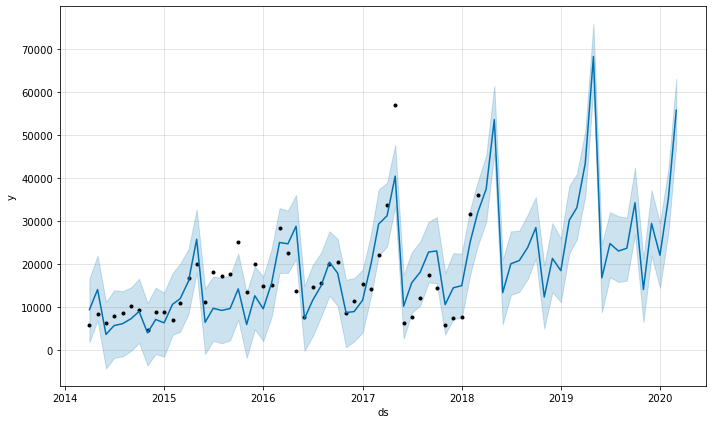

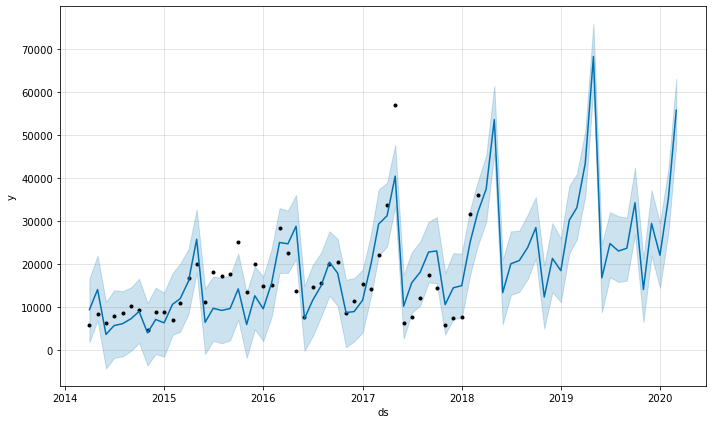

In [205]:
pt.plot(prop1)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,3.499813e+05,1.121968e+05,5.133899e+05,3.499813e+05,3.499813e+05,-0.112559,-0.112559,-0.112559,-0.112559,-0.112559,-0.112559,0.0,0.0,0.0,3.105877e+05,Delhi,Mixers
1,2014-05-01,3.683952e+05,2.312767e+05,6.222268e+05,3.683952e+05,3.683952e+05,0.165951,0.165951,0.165951,0.165951,0.165951,0.165951,0.0,0.0,0.0,4.295306e+05,Delhi,Mixers
2,2014-06-01,3.874229e+05,9.382341e+04,4.781096e+05,3.874229e+05,3.874229e+05,-0.238477,-0.238477,-0.238477,-0.238477,-0.238477,-0.238477,0.0,0.0,0.0,2.950313e+05,Delhi,Mixers
3,2014-07-01,4.058368e+05,2.609305e+05,6.510235e+05,4.058368e+05,4.058368e+05,0.095363,0.095363,0.095363,0.095363,0.095363,0.095363,0.0,0.0,0.0,4.445385e+05,Delhi,Mixers
4,2014-08-01,4.248644e+05,2.751457e+05,6.723725e+05,4.248644e+05,4.248644e+05,0.113332,0.113332,0.113332,0.113332,0.113332,0.113332,0.0,0.0,0.0,4.730152e+05,Delhi,Mixers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,1.602125e+06,8.864002e+05,1.275930e+06,1.602125e+06,1.602125e+06,-0.331866,-0.331866,-0.331866,-0.331866,-0.331866,-0.331866,0.0,0.0,0.0,1.070434e+06,Delhi,Mixers
68,2019-12-01,1.620539e+06,1.580475e+06,1.971157e+06,1.620539e+06,1.620539e+06,0.093336,0.093336,0.093336,0.093336,0.093336,0.093336,0.0,0.0,0.0,1.771793e+06,Delhi,Mixers
69,2020-01-01,1.639566e+06,1.371204e+06,1.754780e+06,1.639566e+06,1.639567e+06,-0.047064,-0.047064,-0.047064,-0.047064,-0.047064,-0.047064,0.0,0.0,0.0,1.562401e+06,Delhi,Mixers
70,2020-02-01,1.658594e+06,1.023290e+06,1.406730e+06,1.658594e+06,1.658594e+06,-0.265121,-0.265121,-0.265121,-0.265121,-0.265121,-0.265121,0.0,0.0,0.0,1.218865e+06,Delhi,Mixers


In [206]:
new_cols = ['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
           'multiplicative_terms', 'multiplicative_terms_lower',
           'multiplicative_terms_upper', 'yearly', 'yearly_lower', 'yearly_upper',
           'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
           'yhat']

In [195]:
prop1

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,city,product
0,2014-04-01,3.499813e+05,1.121968e+05,5.133899e+05,3.499813e+05,3.499813e+05,-0.112559,-0.112559,-0.112559,-0.112559,-0.112559,-0.112559,0.0,0.0,0.0,3.105877e+05,Delhi,Mixers
1,2014-05-01,3.683952e+05,2.312767e+05,6.222268e+05,3.683952e+05,3.683952e+05,0.165951,0.165951,0.165951,0.165951,0.165951,0.165951,0.0,0.0,0.0,4.295306e+05,Delhi,Mixers
2,2014-06-01,3.874229e+05,9.382341e+04,4.781096e+05,3.874229e+05,3.874229e+05,-0.238477,-0.238477,-0.238477,-0.238477,-0.238477,-0.238477,0.0,0.0,0.0,2.950313e+05,Delhi,Mixers
3,2014-07-01,4.058368e+05,2.609305e+05,6.510235e+05,4.058368e+05,4.058368e+05,0.095363,0.095363,0.095363,0.095363,0.095363,0.095363,0.0,0.0,0.0,4.445385e+05,Delhi,Mixers
4,2014-08-01,4.248644e+05,2.751457e+05,6.723725e+05,4.248644e+05,4.248644e+05,0.113332,0.113332,0.113332,0.113332,0.113332,0.113332,0.0,0.0,0.0,4.730152e+05,Delhi,Mixers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,2019-11-01,1.602125e+06,8.864002e+05,1.275930e+06,1.602125e+06,1.602125e+06,-0.331866,-0.331866,-0.331866,-0.331866,-0.331866,-0.331866,0.0,0.0,0.0,1.070434e+06,Delhi,Mixers
68,2019-12-01,1.620539e+06,1.580475e+06,1.971157e+06,1.620539e+06,1.620539e+06,0.093336,0.093336,0.093336,0.093336,0.093336,0.093336,0.0,0.0,0.0,1.771793e+06,Delhi,Mixers
69,2020-01-01,1.639566e+06,1.371204e+06,1.754780e+06,1.639566e+06,1.639567e+06,-0.047064,-0.047064,-0.047064,-0.047064,-0.047064,-0.047064,0.0,0.0,0.0,1.562401e+06,Delhi,Mixers
70,2020-02-01,1.658594e+06,1.023290e+06,1.406730e+06,1.658594e+06,1.658594e+06,-0.265121,-0.265121,-0.265121,-0.265121,-0.265121,-0.265121,0.0,0.0,0.0,1.218865e+06,Delhi,Mixers


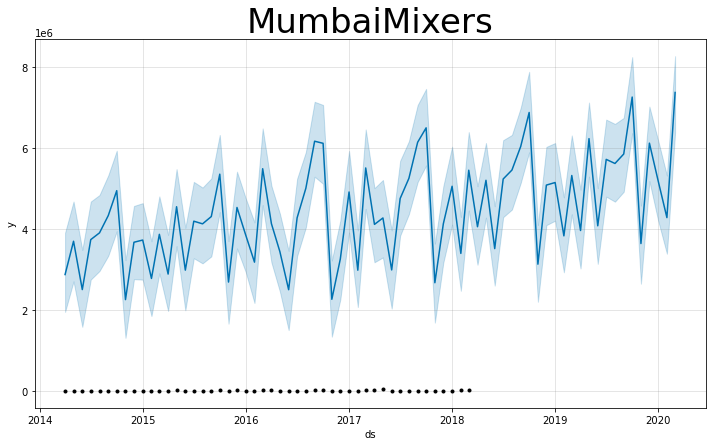

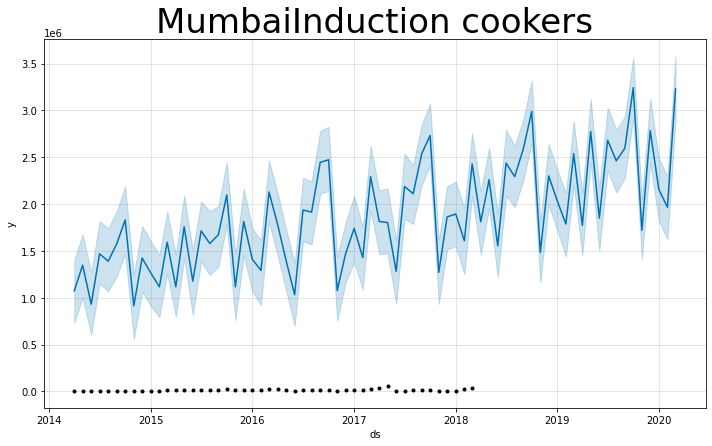

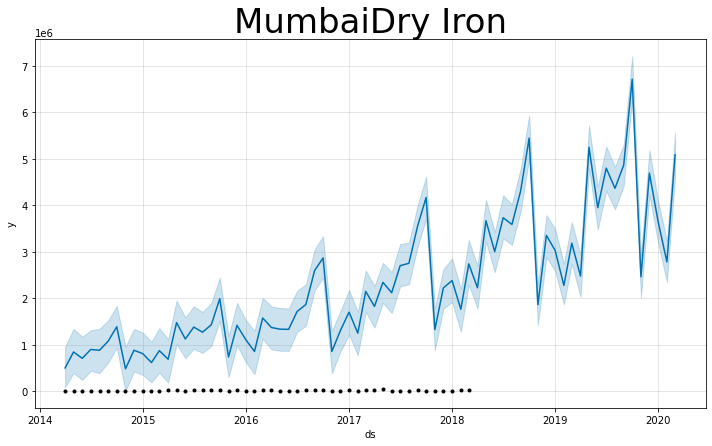

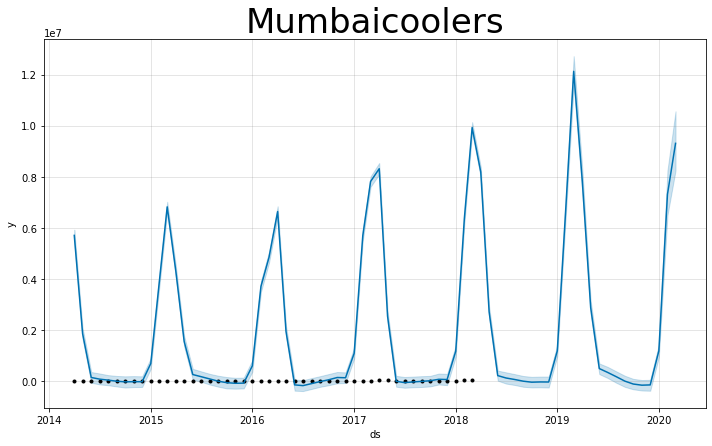

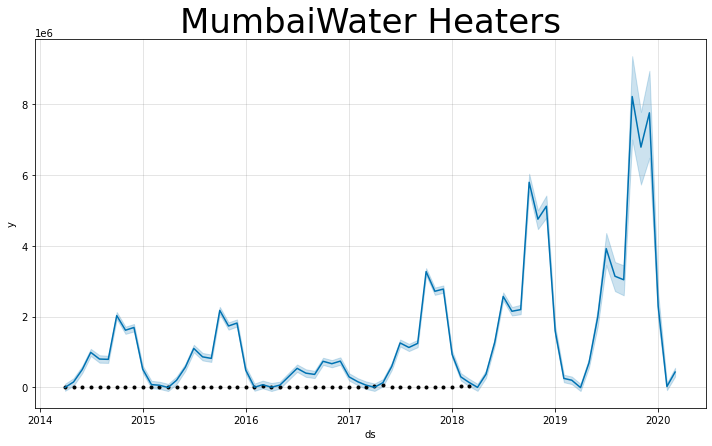

...

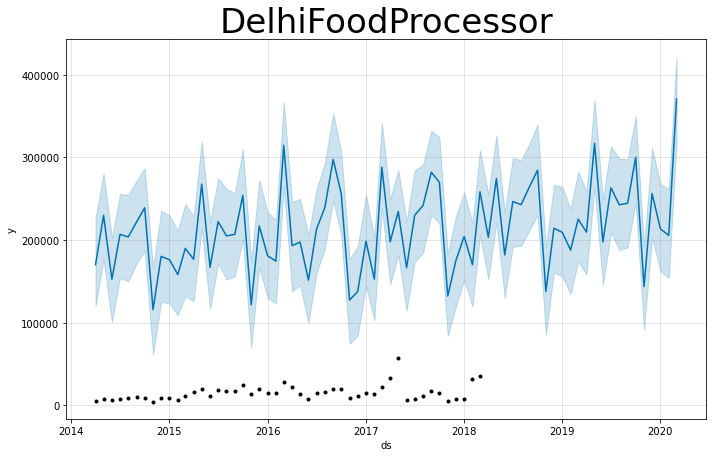

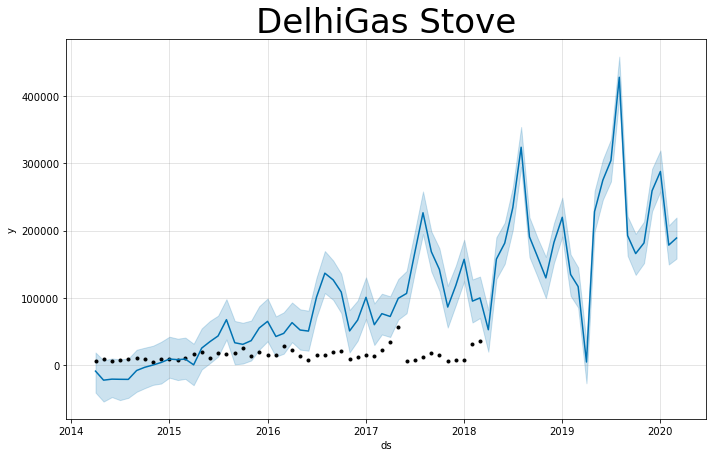

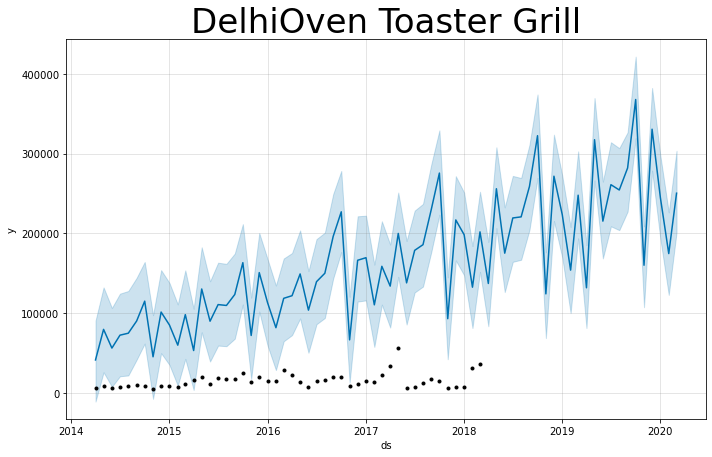

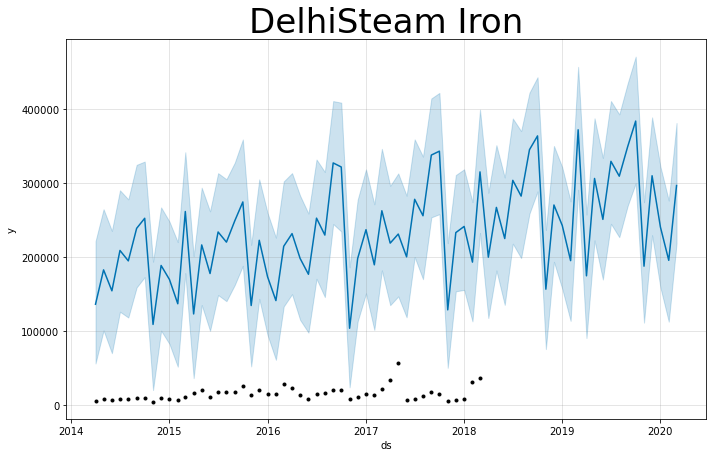

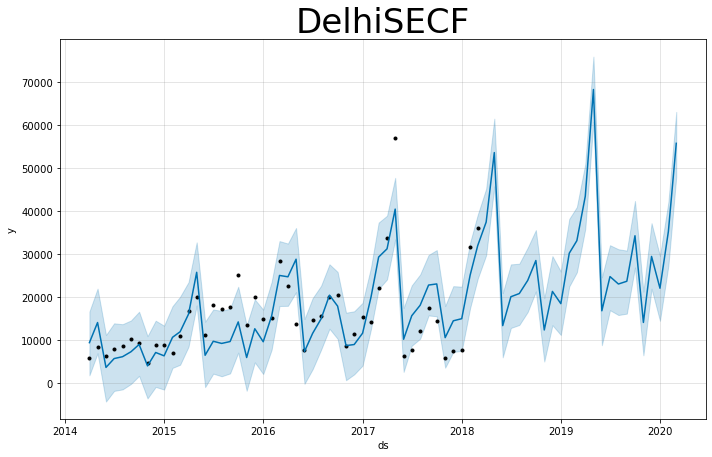

In [210]:
for city in data['city'].unique():
    for prod in data['product'].unique(): 
        prop1 = landing_tbl[(landing_tbl['product'] == prod) & (landing_tbl['city'] == city)]
        fig=pt.plot(prop1)
        ax = fig.gca()
        a=city+ prod
        ax.set_title((a), size=34)
        plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


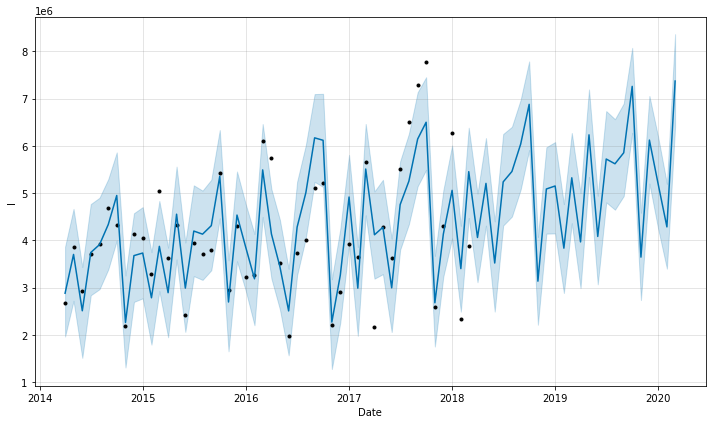

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


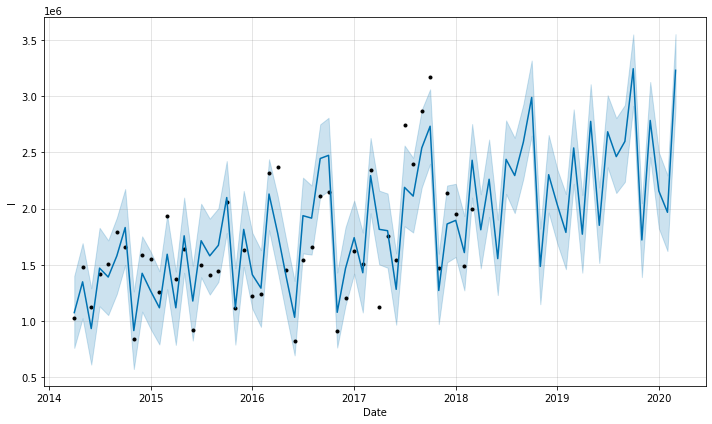

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


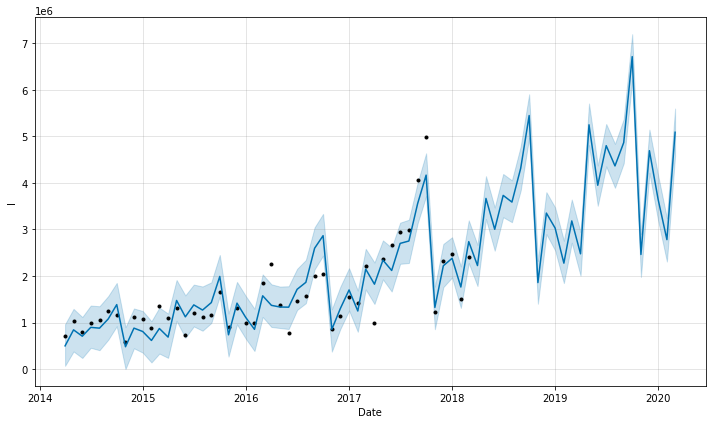

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


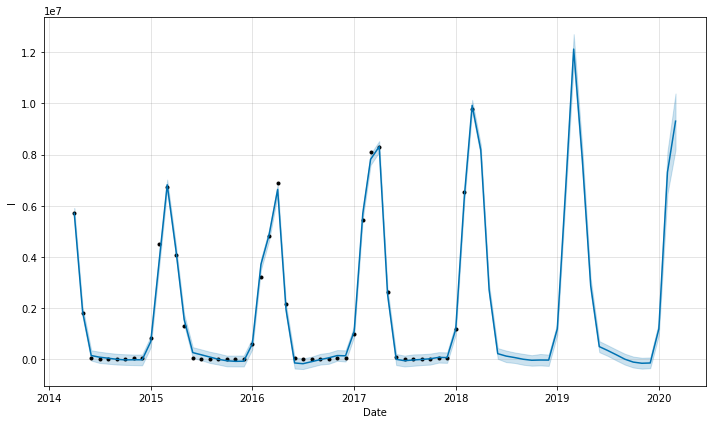

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


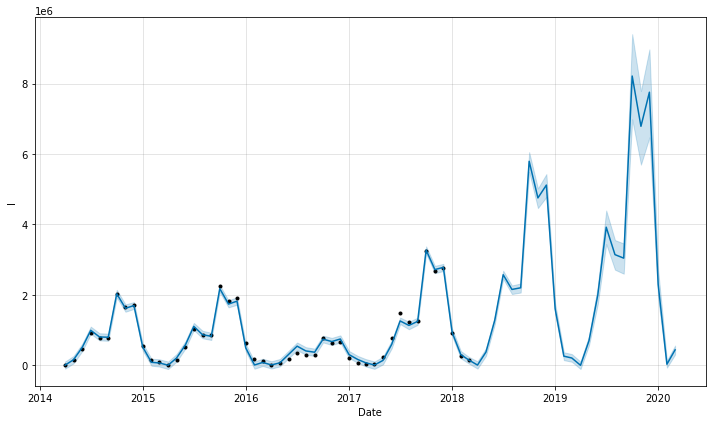

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


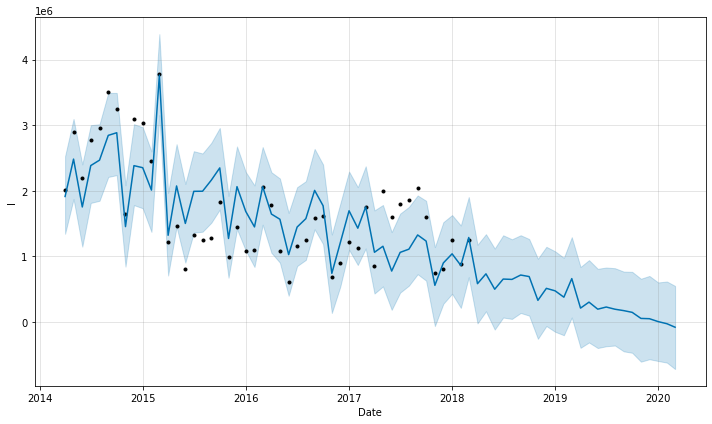

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


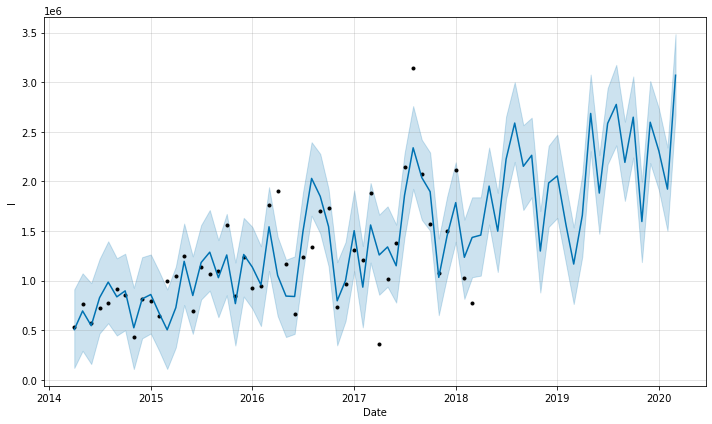

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


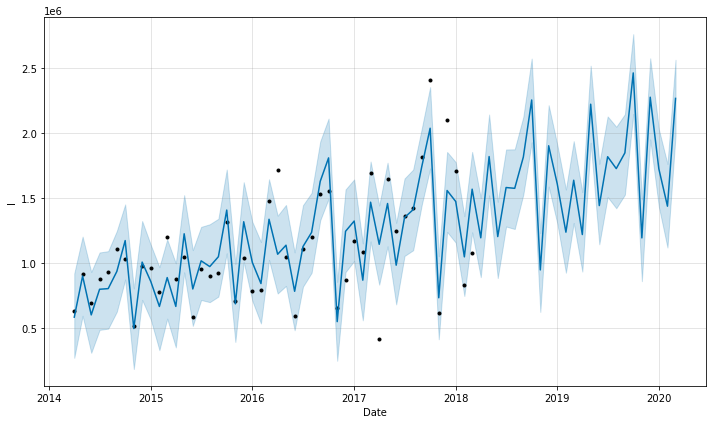

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


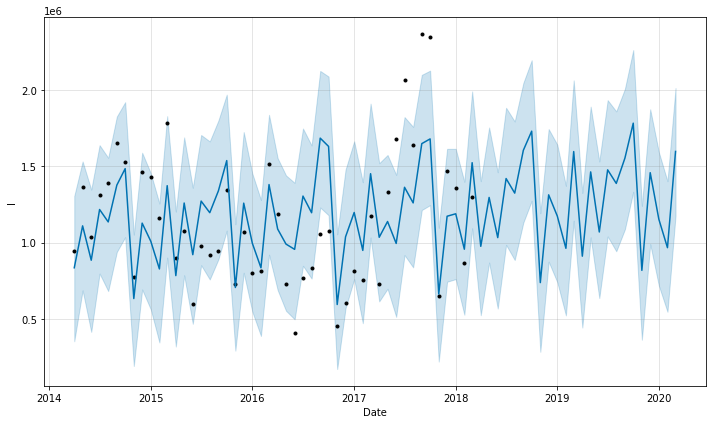

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


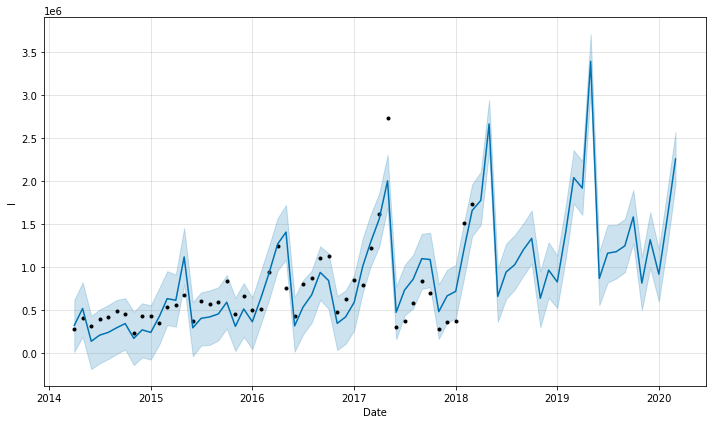

In [218]:
for prod in data['product'].unique():
    mixers_prod = data[(data['product'] == prod) & (data['city'] == "Mumbai")][['date','sales']]
    dset = mixers_prod.rename(columns = {"date" : "ds","sales" : "y"})
    pt = Prophet(seasonality_mode = 'multiplicative')
    pt.fit(dset)
    future = pt.make_future_dataframe(periods = 12*2, freq = 'MS')
    forecast = pt.predict(future)
    a= ("Mumbai" + prod)
    ax = fig.gca()
    ax.set_title((a), size=34)
    pt.plot(forecast, xlabel = 'Date', ylabel = "l")
    plt.show()

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


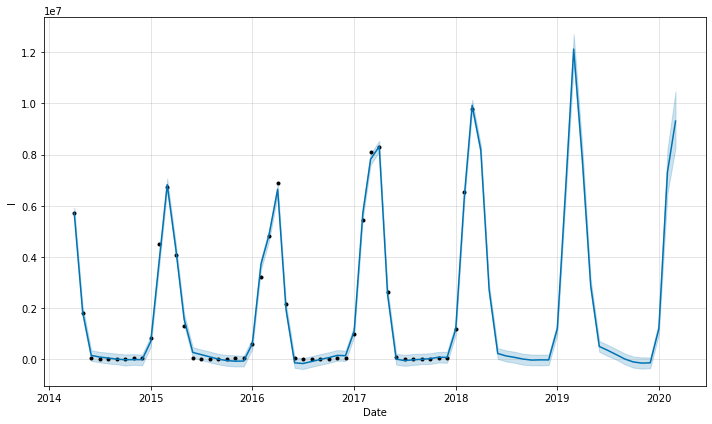

In [217]:

mixers_prod = data[(data['product'] == 'coolers') & (data['city'] == "Mumbai")][['date','sales']]
dset = mixers_prod.rename(columns = {"date" : "ds","sales" : "y"})
pt = Prophet(seasonality_mode = 'multiplicative')
pt.fit(dset)
future = pt.make_future_dataframe(periods = 12*2, freq = 'MS')
forecast = pt.predict(future)
a= "Mumbai"
ax = fig.gca()
ax.set_title((a), size=34)
pt.plot(forecast, xlabel = 'Date', ylabel = "l")
plt.show()